In [1]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

2025-02-24 18:18:48.993495: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-24 18:18:49.297629: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740449929.424498   14219 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740449929.486893   14219 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-24 18:18:49.772702: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
image_path = '../temp/training/Images/'
mask_path = '../temp/training/Masks/'
SIZE = 128

In [3]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 3288/3288 [00:13<00:00, 252.64it/s]


In [4]:
# Train test split
# images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.01)

# Train test split with no images left for testing
images_train = images
images_test = []
mask_train = masks
mask_test = []

print(f'Train images: {len(images_train)}')
print(f'Test images: {len(images_test)}')

Train images: 3288
Test images: 0


In [5]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [6]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

I0000 00:00:1740449959.442979   14219 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9062 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 16, 16,    │          0 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 128) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 8, 8, 128) │          0 │ max_pooling2d_3[

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [7]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100


I0000 00:00:1740449963.000262   14372 service.cc:148] XLA service 0x7f404c001ee0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1740449963.000416   14372 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2025-02-24 18:19:23.081105: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1740449963.420398   14372 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-02-24 18:19:24.115867: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[32,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_con

  2/103 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.1927 - loss: 0.7080  

2025-02-24 18:19:32.065120: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1740449972.093139   14372 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


102/103 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.5475 - loss: 0.6061

2025-02-24 18:19:36.749018: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[24,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[24,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-02-24 18:19:36.763357: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[24,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[24,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationFor

103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.5481 - loss: 0.6054

2025-02-24 18:19:43.477731: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-02-24 18:19:43.500282: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


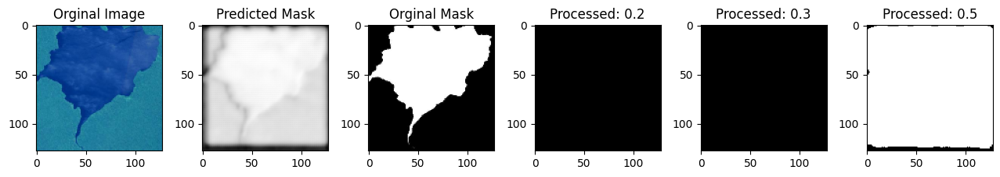

103/103 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - accuracy: 0.5487 - loss: 0.6047
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.6771 - loss: 0.436


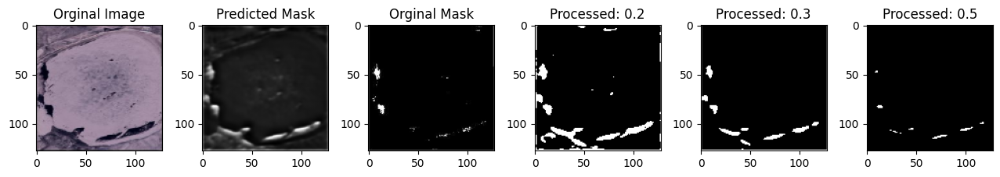

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.6773 - loss: 0.4358
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7017 - loss: 0.39


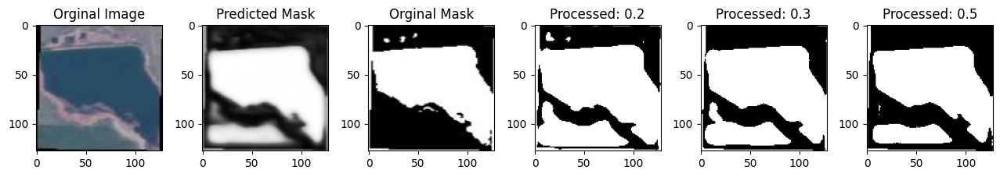

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7017 - loss: 0.3926
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.6979 - loss: 0.40


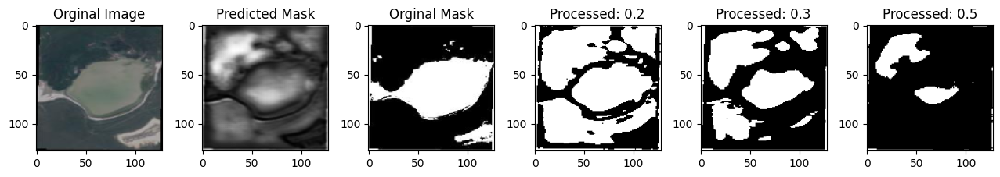

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.6980 - loss: 0.4007
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7173 - loss: 0.367


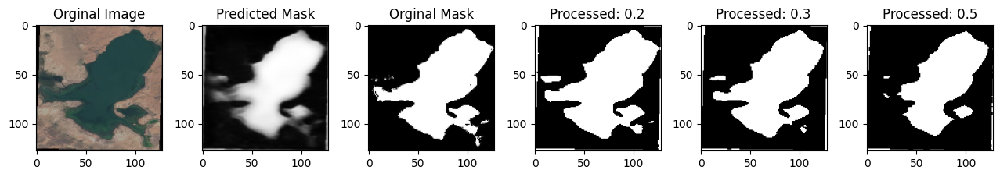

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7173 - loss: 0.3673
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7247 - loss: 0.34


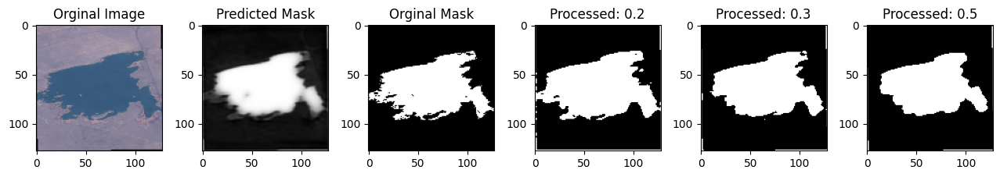

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7247 - loss: 0.3463
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7303 - loss: 0.33


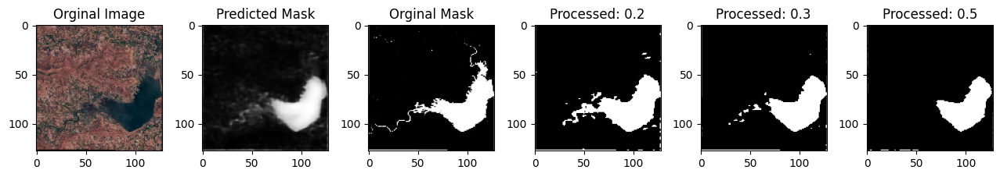

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.7303 - loss: 0.3355
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7318 - loss: 0.32


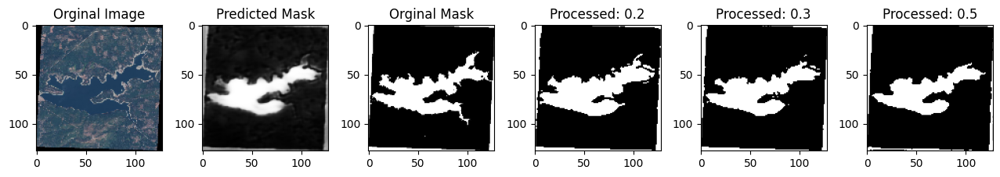

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7319 - loss: 0.3206
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7380 - loss: 0.31


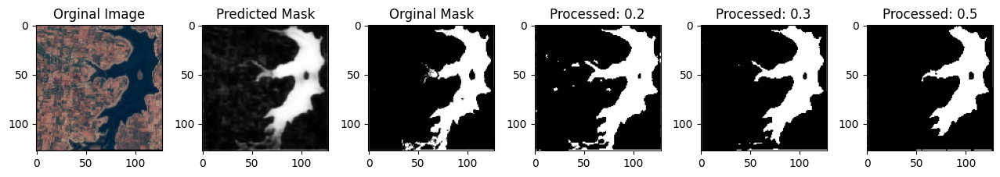

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7380 - loss: 0.3122
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7369 - loss: 0.31


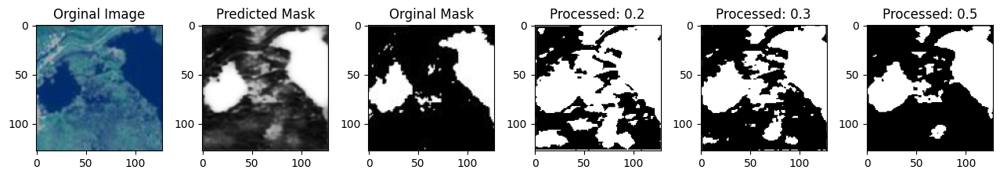

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7370 - loss: 0.3179
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7383 - loss: 0.30


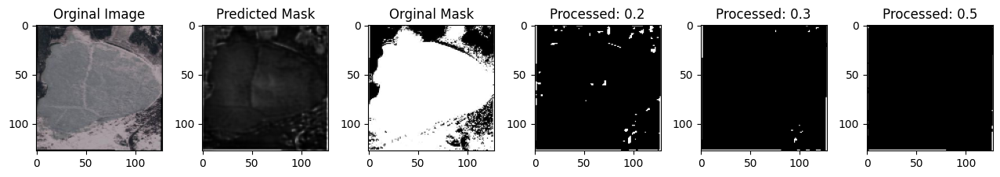

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.7384 - loss: 0.3035
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7407 - loss: 0.30


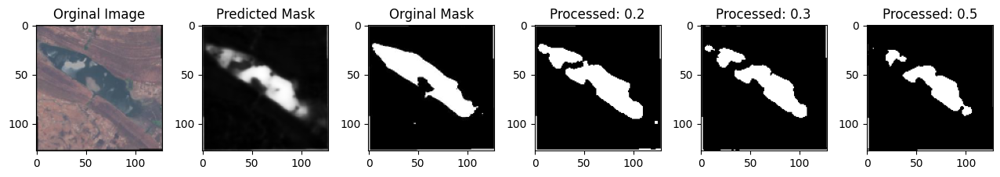

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7407 - loss: 0.3031
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7375 - loss: 0.31


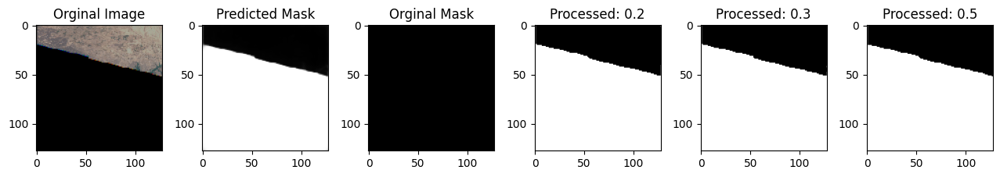

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7376 - loss: 0.3126
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7483 - loss: 0.29


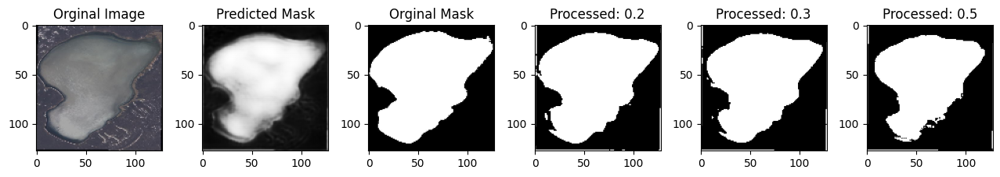

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7482 - loss: 0.2914
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7488 - loss: 0.28


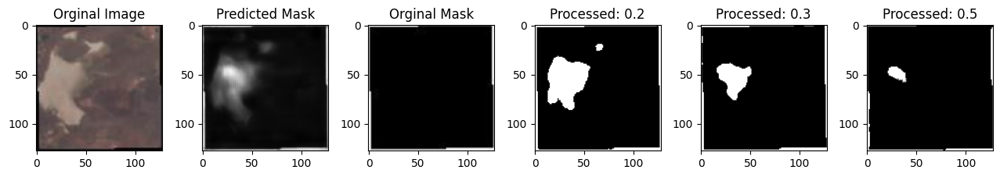

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7488 - loss: 0.2836
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7513 - loss: 0.27


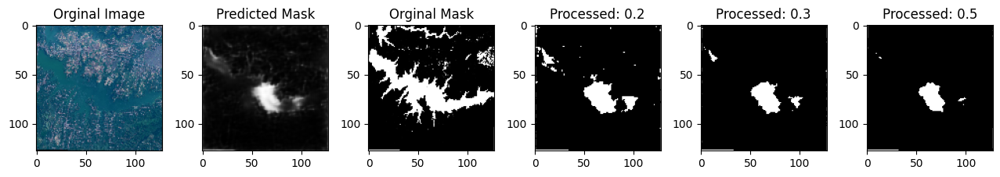

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7513 - loss: 0.2790
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7522 - loss: 0.27


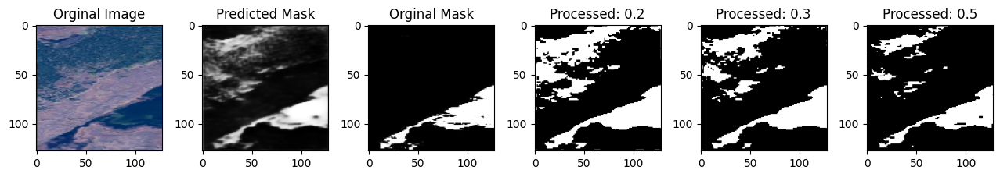

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7521 - loss: 0.2729
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7506 - loss: 0.27


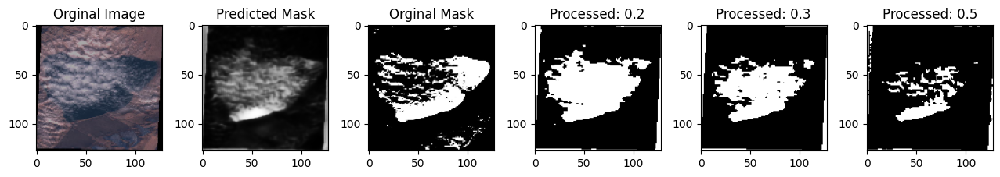

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7506 - loss: 0.2789
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7498 - loss: 0.27


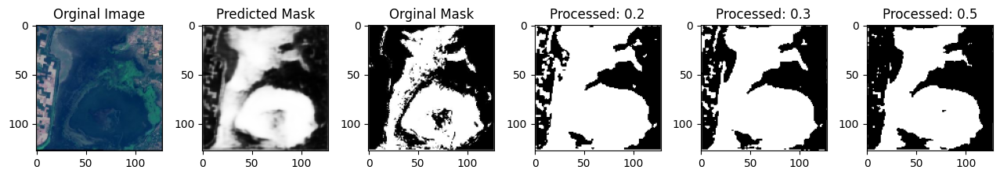

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7498 - loss: 0.2746
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7527 - loss: 0.26


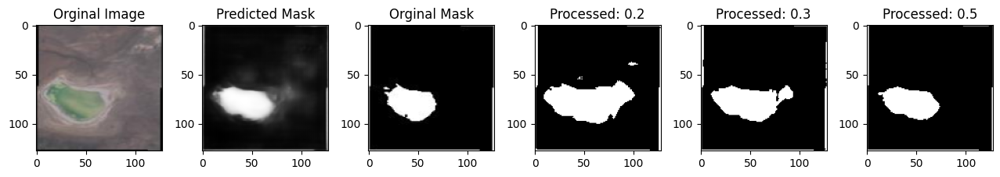

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7527 - loss: 0.2698
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7511 - loss: 0.26


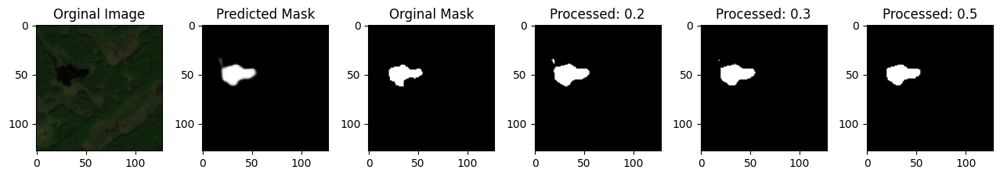

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7511 - loss: 0.2649
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7553 - loss: 0.26


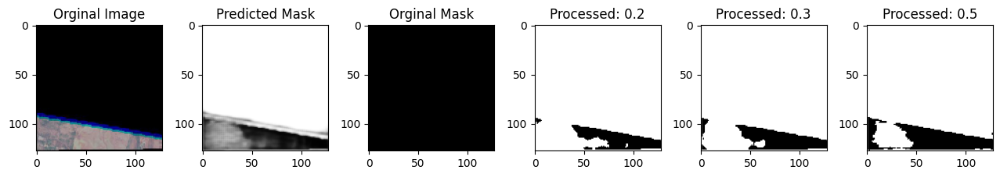

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7554 - loss: 0.2621
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7516 - loss: 0.27


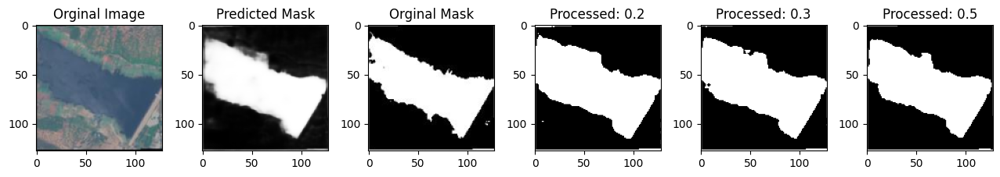

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7516 - loss: 0.2783
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7625 - loss: 0.24


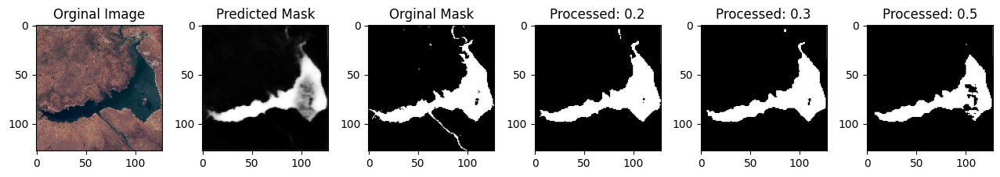

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7625 - loss: 0.2452
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7668 - loss: 0.24


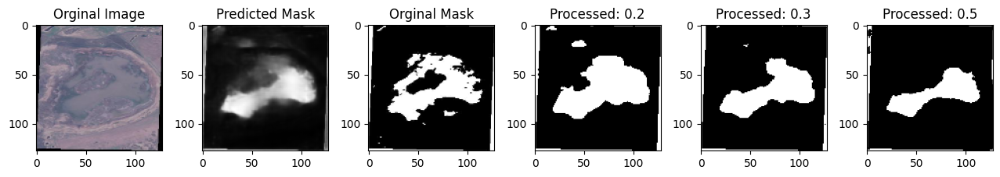

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7667 - loss: 0.2448
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7562 - loss: 0.28


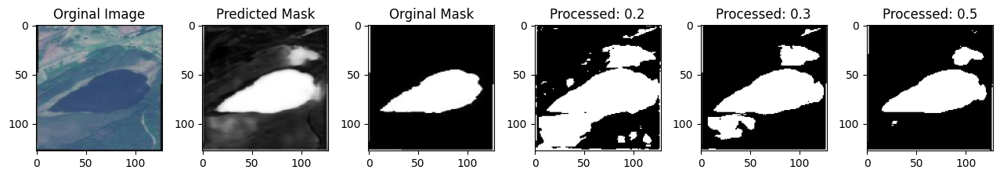

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.7561 - loss: 0.2804
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7597 - loss: 0.26


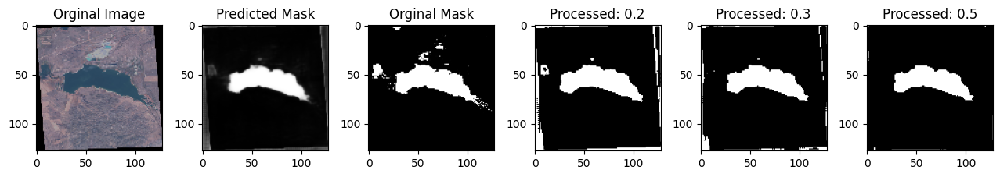

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7597 - loss: 0.2641
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7541 - loss: 0.26


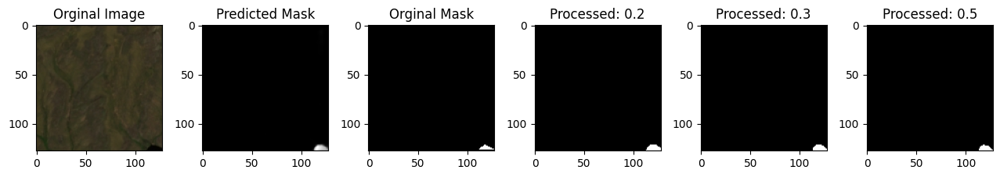

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7542 - loss: 0.2668
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7663 - loss: 0.24


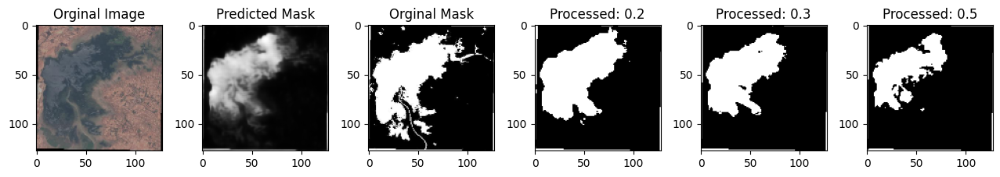

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7662 - loss: 0.2470
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7640 - loss: 0.237


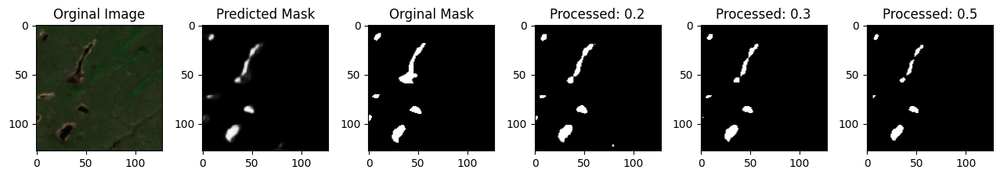

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7640 - loss: 0.2378
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7678 - loss: 0.22


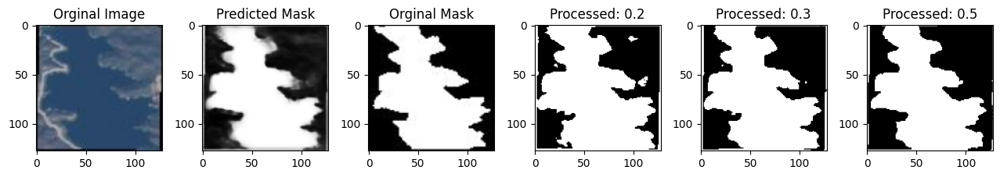

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7678 - loss: 0.2279
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7659 - loss: 0.24


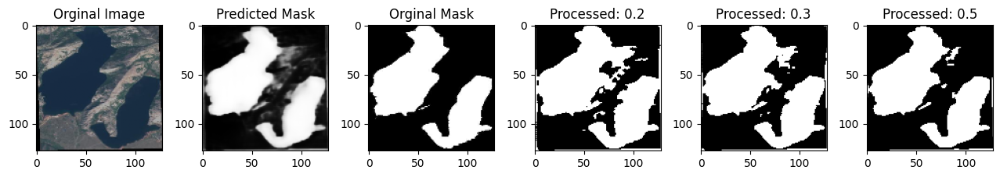

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.7659 - loss: 0.2488
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7390 - loss: 0.31


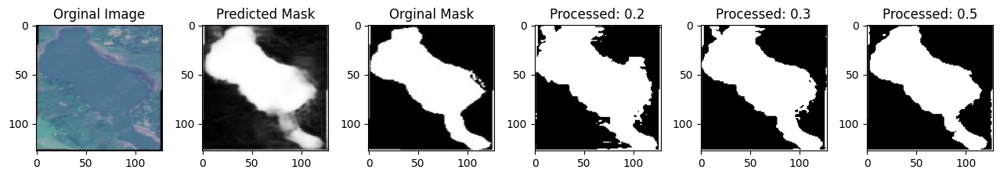

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7390 - loss: 0.3178
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7550 - loss: 0.26


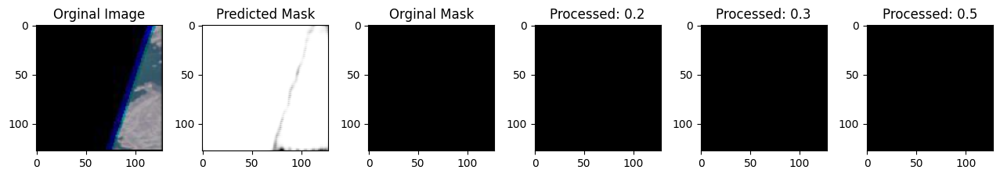

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7551 - loss: 0.2605
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7645 - loss: 0.246


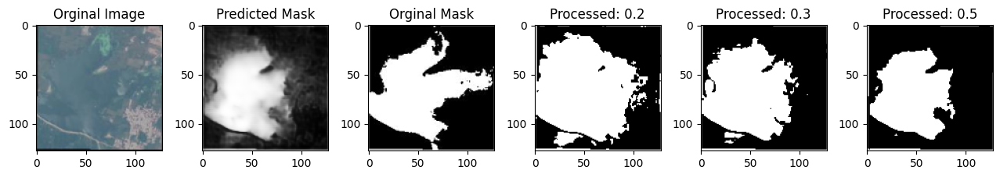

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7645 - loss: 0.2466
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7601 - loss: 0.24


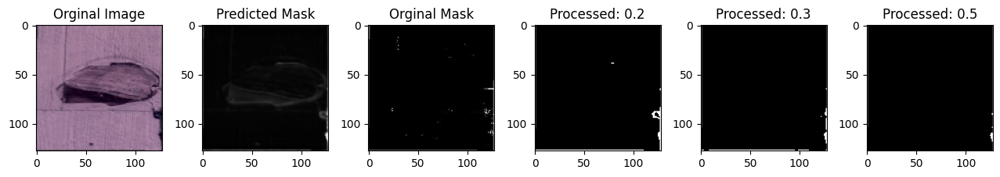

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7601 - loss: 0.2480
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7657 - loss: 0.23


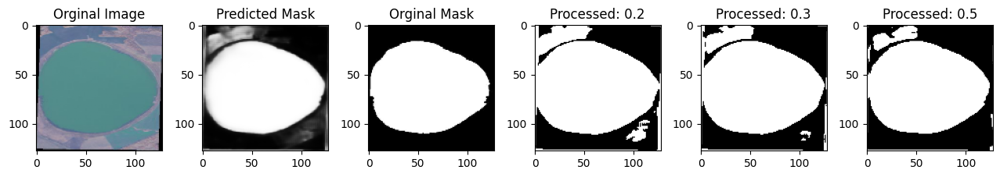

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.7657 - loss: 0.2397
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/stepstep - accuracy: 0.7667 - loss: 0.238


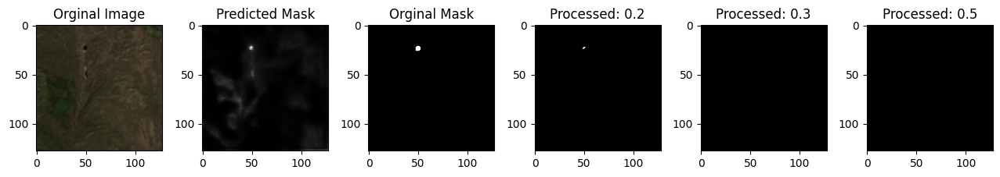

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7667 - loss: 0.2383
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7677 - loss: 0.22


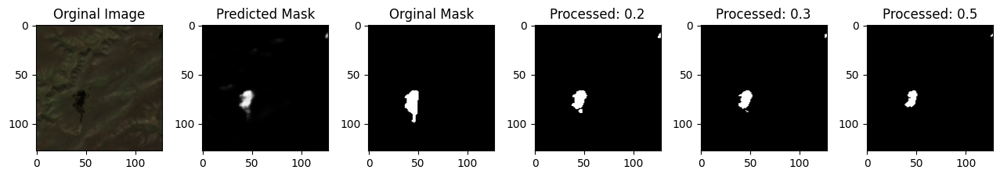

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7677 - loss: 0.2267
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7674 - loss: 0.23


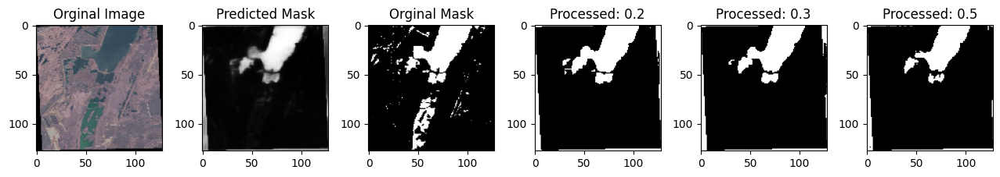

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7674 - loss: 0.2320
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7721 - loss: 0.22


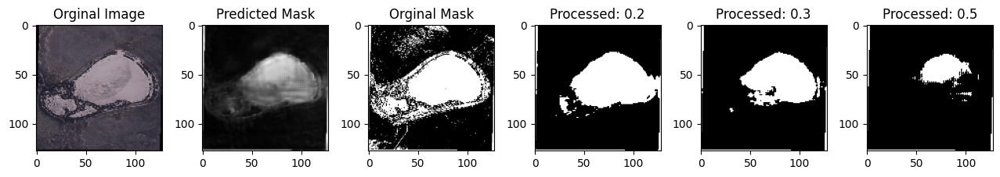

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7721 - loss: 0.2248
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7668 - loss: 0.232


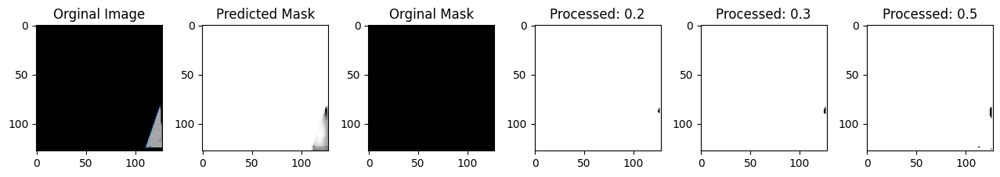

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7669 - loss: 0.2328
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7732 - loss: 0.22


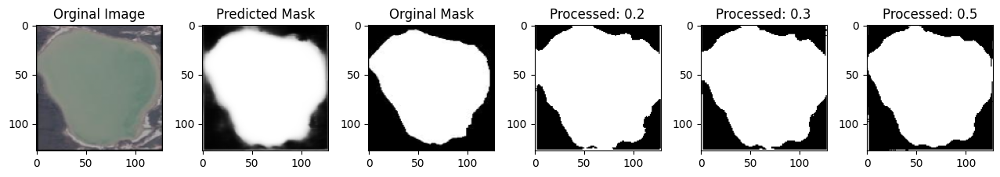

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7732 - loss: 0.2254
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7759 - loss: 0.21


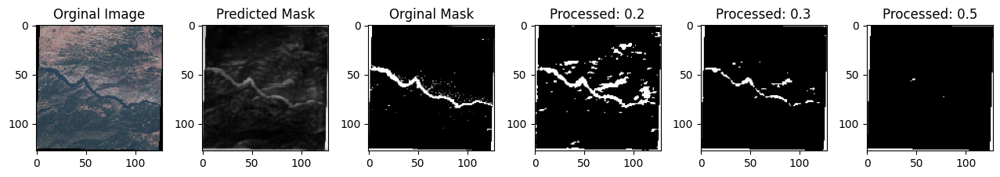

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7758 - loss: 0.2154
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7689 - loss: 0.23


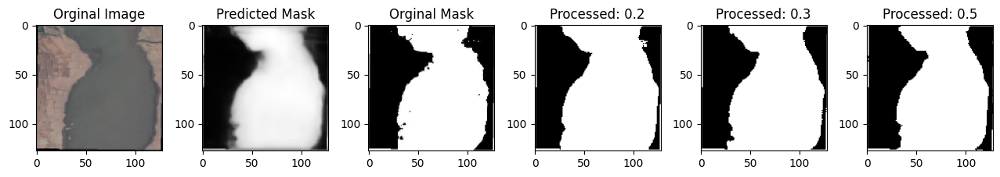

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7689 - loss: 0.2309
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7677 - loss: 0.225


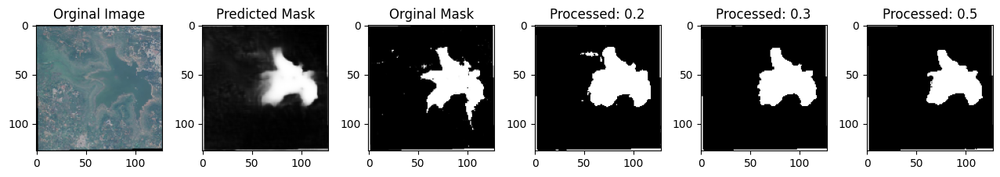

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7677 - loss: 0.2253
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7717 - loss: 0.227


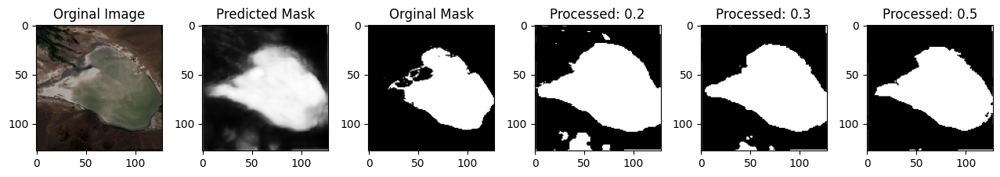

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7717 - loss: 0.2272
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7691 - loss: 0.22


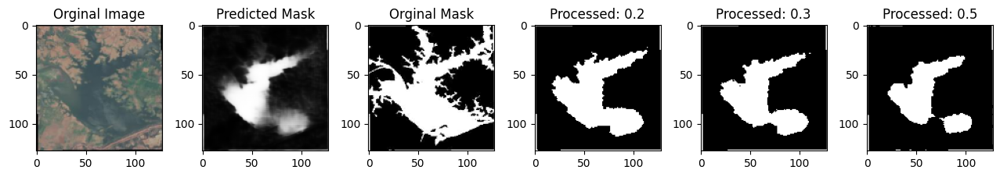

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.7692 - loss: 0.2205
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7762 - loss: 0.21


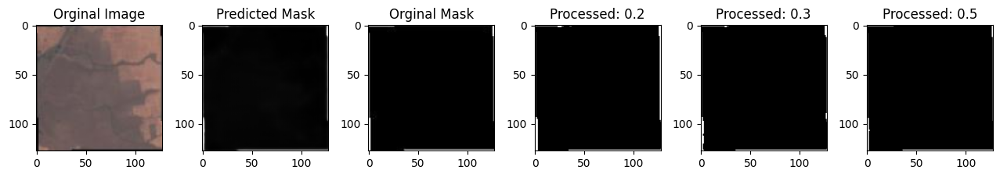

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7762 - loss: 0.2158
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7721 - loss: 0.212


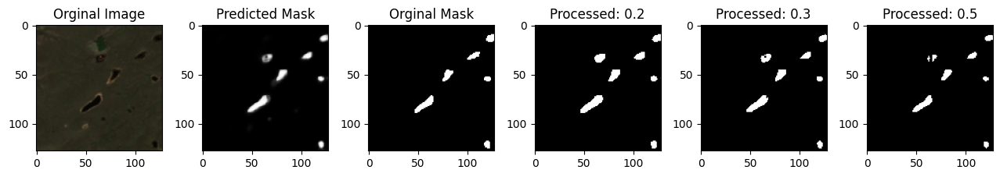

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7721 - loss: 0.2125
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7748 - loss: 0.216


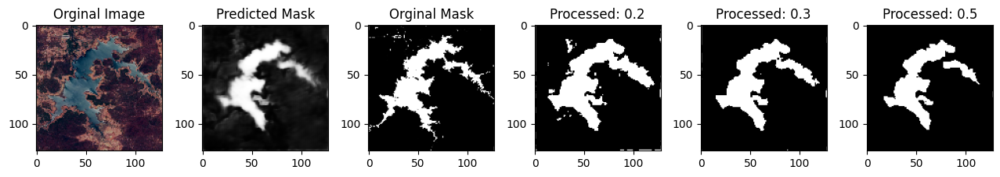

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7748 - loss: 0.2163
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7756 - loss: 0.21


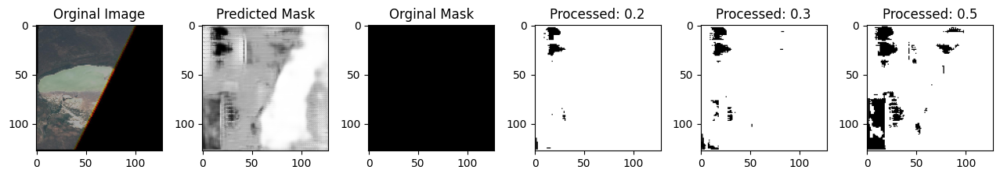

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7756 - loss: 0.2108
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7635 - loss: 0.24


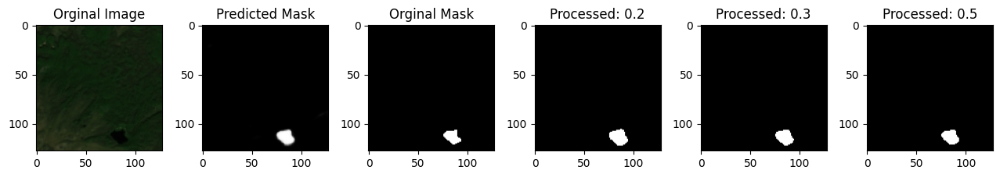

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7637 - loss: 0.2491
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7671 - loss: 0.227


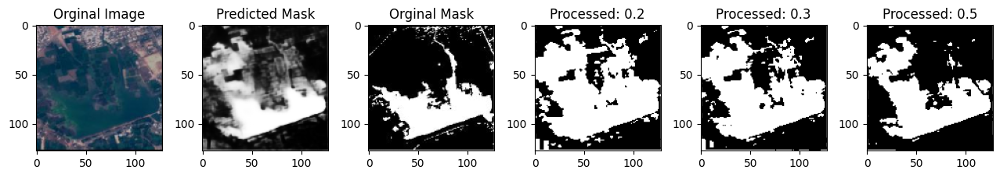

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7672 - loss: 0.2271
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7776 - loss: 0.21


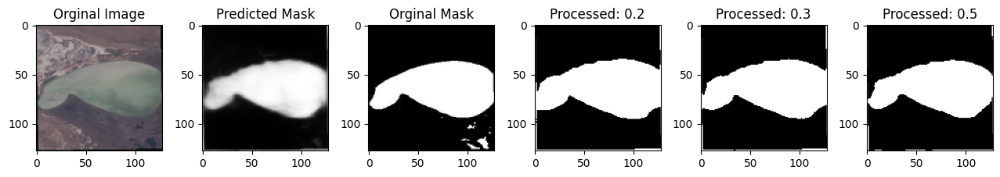

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7776 - loss: 0.2122
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7741 - loss: 0.21


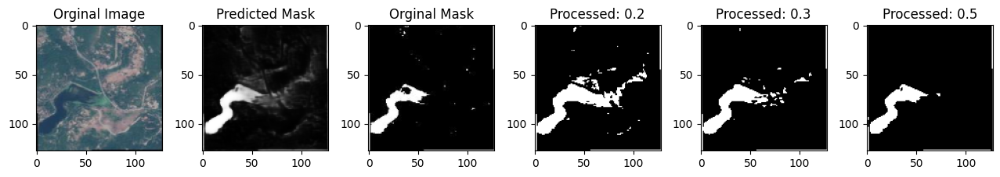

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7741 - loss: 0.2165
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7773 - loss: 0.20


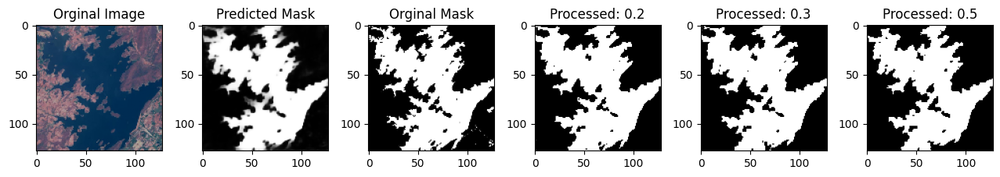

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7773 - loss: 0.2086
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7736 - loss: 0.20


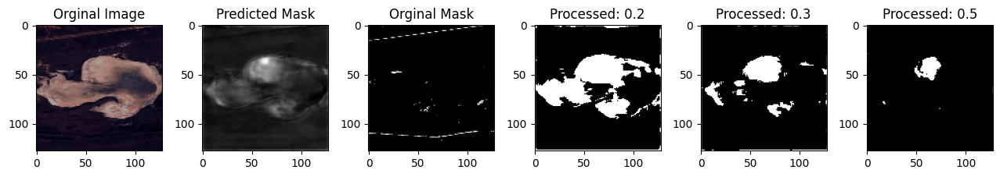

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7737 - loss: 0.2032
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7756 - loss: 0.20


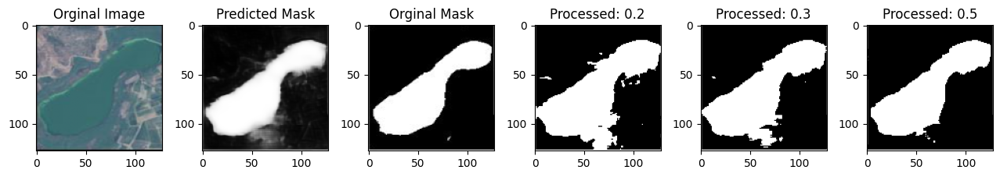

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7756 - loss: 0.2016
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7781 - loss: 0.20


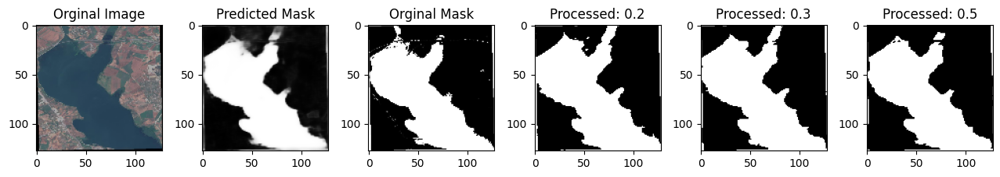

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7781 - loss: 0.2013
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7759 - loss: 0.20


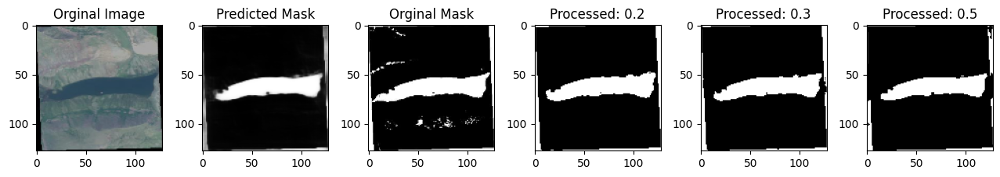

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7760 - loss: 0.2009
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7814 - loss: 0.19


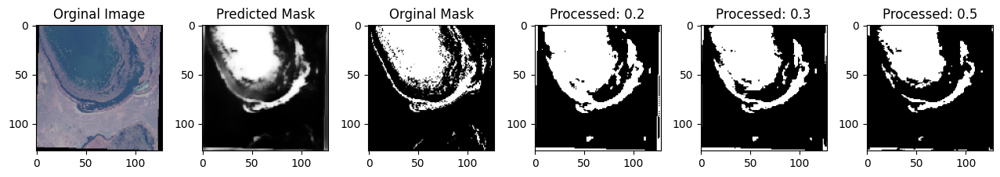

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7814 - loss: 0.1974
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7574 - loss: 0.25


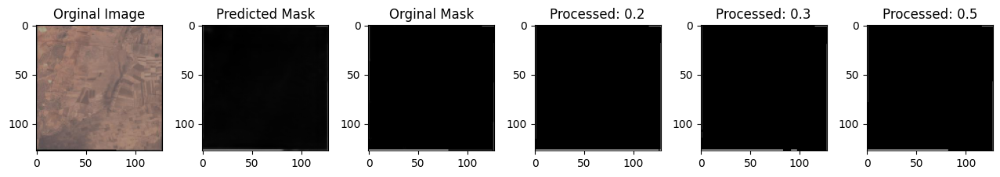

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7575 - loss: 0.2577
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7715 - loss: 0.218


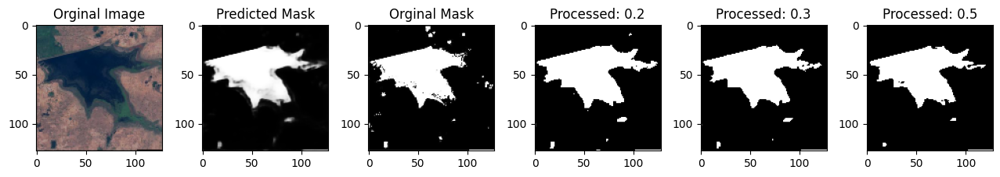

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.7715 - loss: 0.2181
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7497 - loss: 0.29


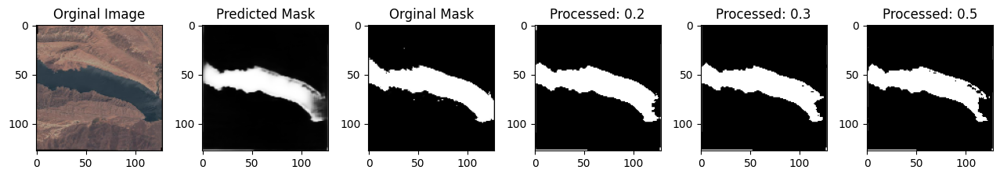

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7498 - loss: 0.2918
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7743 - loss: 0.229


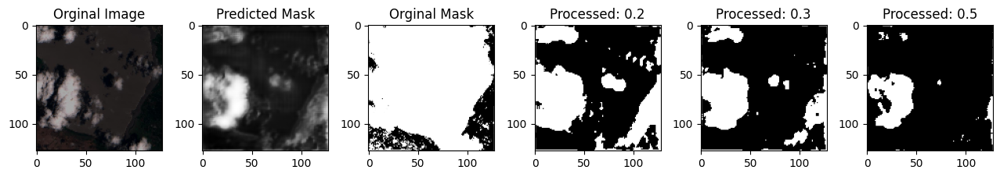

103/103 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7742 - loss: 0.2292
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7770 - loss: 0.210


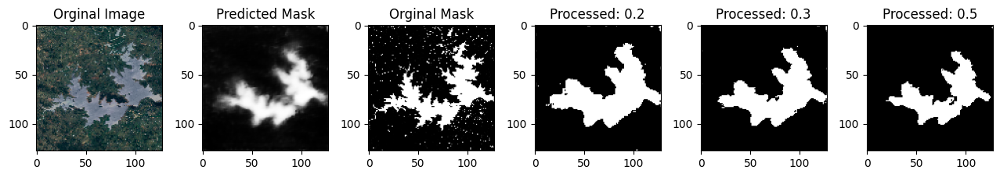

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7770 - loss: 0.2107
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7765 - loss: 0.206


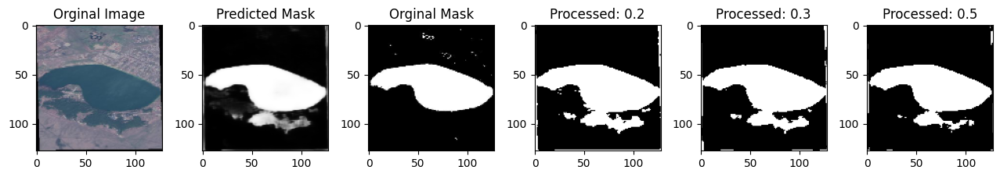

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7765 - loss: 0.2068
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7765 - loss: 0.20


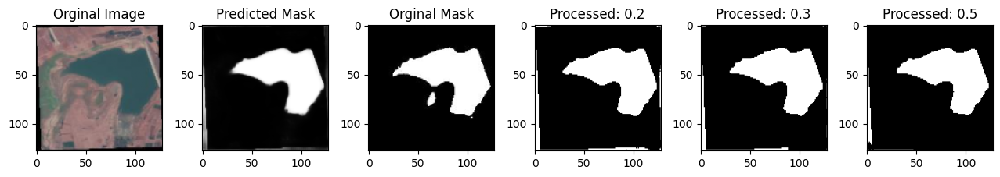

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.7765 - loss: 0.2022
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7783 - loss: 0.20


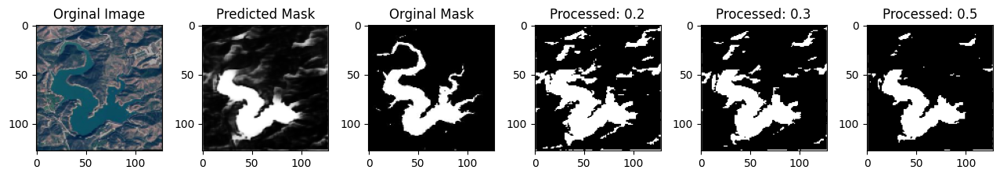

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7783 - loss: 0.2005
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7845 - loss: 0.19


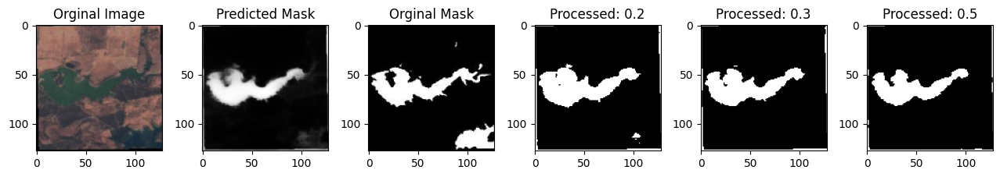

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7845 - loss: 0.1930
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7727 - loss: 0.201


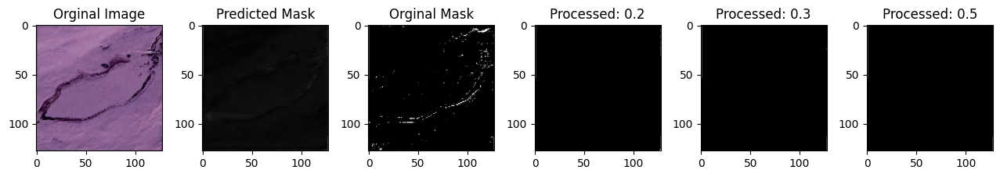

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.7728 - loss: 0.2017
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7772 - loss: 0.198


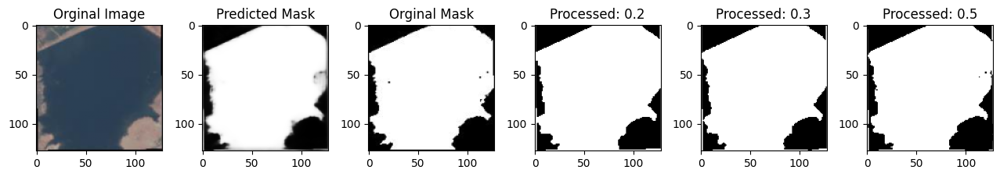

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7772 - loss: 0.1984
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7773 - loss: 0.20


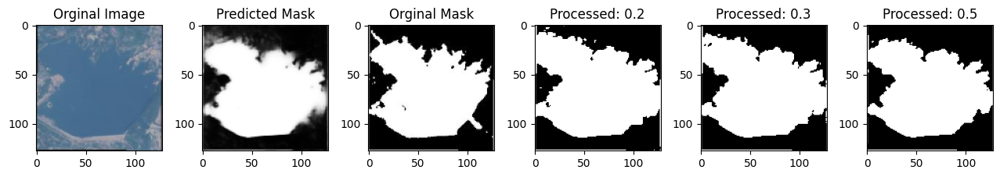

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7773 - loss: 0.2014
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7797 - loss: 0.19


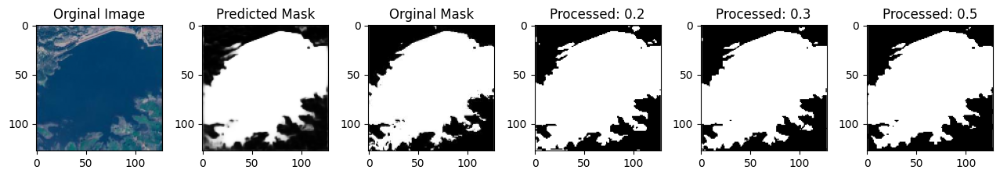

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7797 - loss: 0.1953
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7802 - loss: 0.194


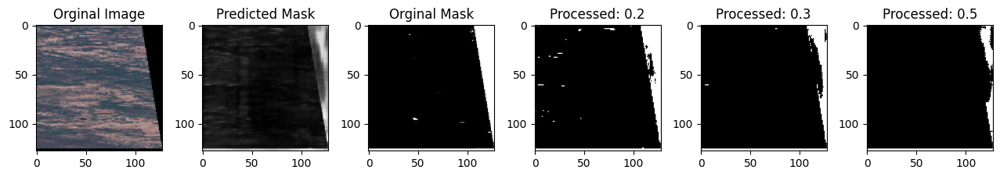

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7801 - loss: 0.1950
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step/step - accuracy: 0.7813 - loss: 0.19


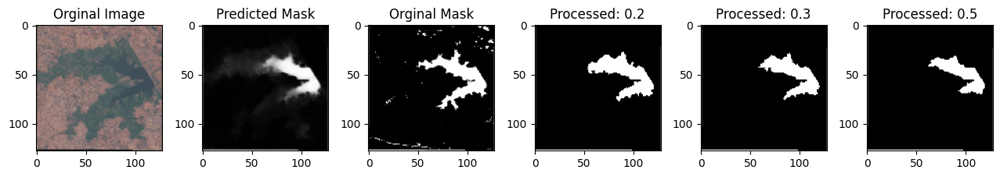

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7812 - loss: 0.1968
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7791 - loss: 0.19


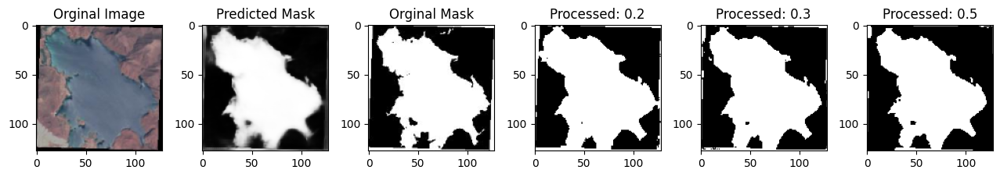

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7791 - loss: 0.1970
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7736 - loss: 0.197


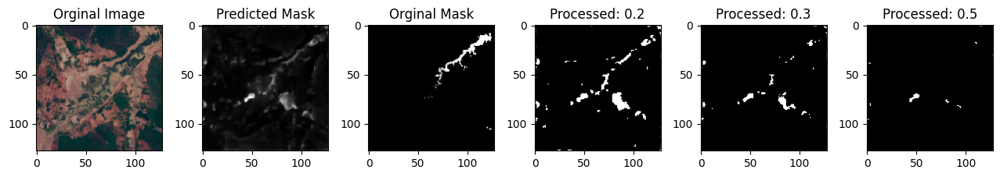

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7736 - loss: 0.1970
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7831 - loss: 0.18


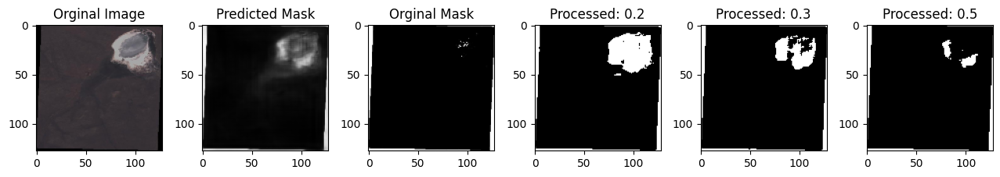

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7831 - loss: 0.1882
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7793 - loss: 0.18


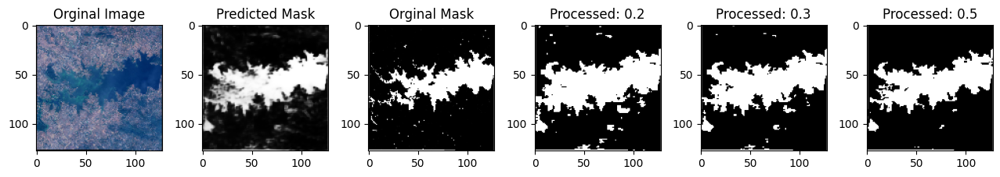

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7793 - loss: 0.1893
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7810 - loss: 0.189


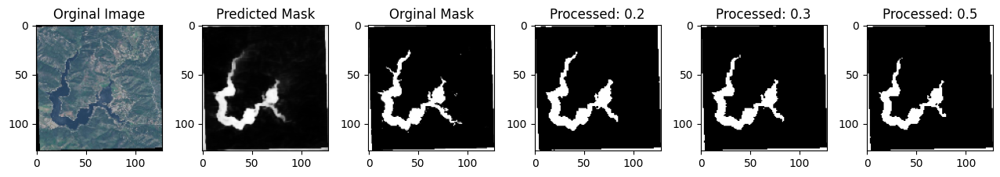

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7810 - loss: 0.1897
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7828 - loss: 0.18


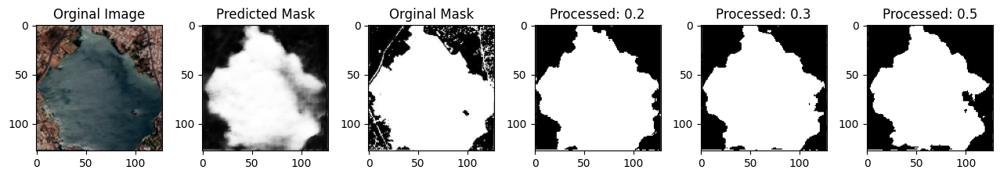

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7828 - loss: 0.1892
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7758 - loss: 0.199


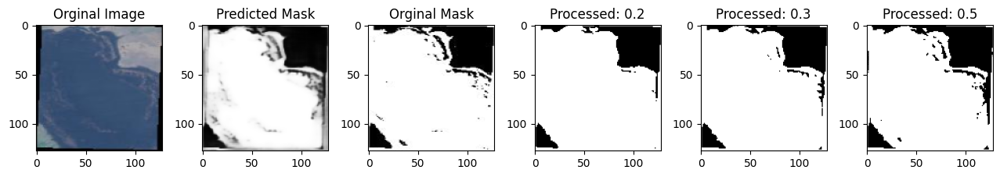

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7758 - loss: 0.1996
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7852 - loss: 0.18


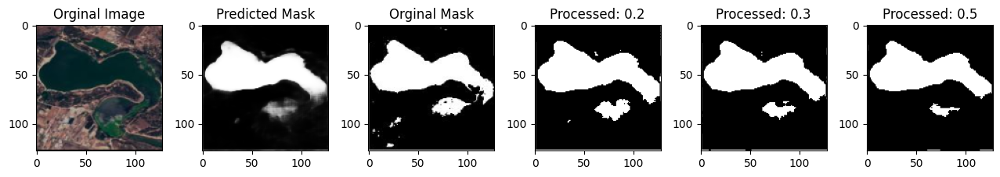

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7852 - loss: 0.1848
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7812 - loss: 0.18


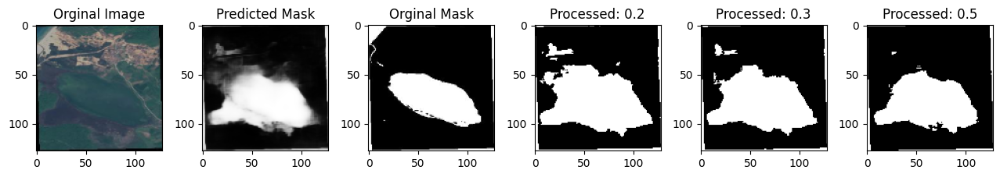

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.7813 - loss: 0.1826
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7891 - loss: 0.179


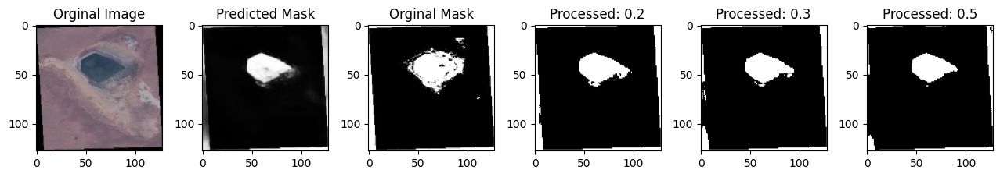

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7890 - loss: 0.1797
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7883 - loss: 0.17


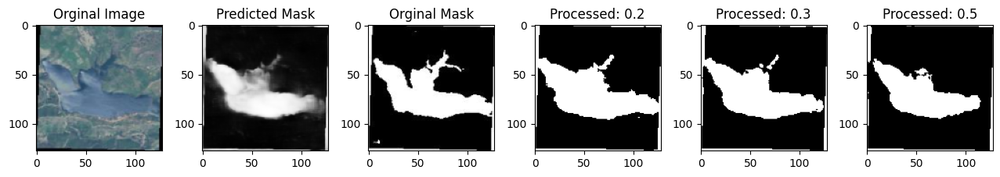

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - accuracy: 0.7882 - loss: 0.1788
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7825 - loss: 0.190


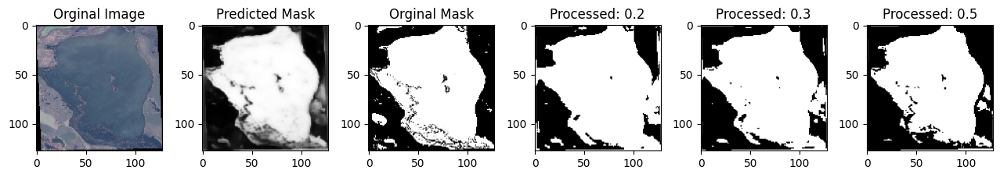

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7825 - loss: 0.1901
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepstep - accuracy: 0.7848 - loss: 0.184


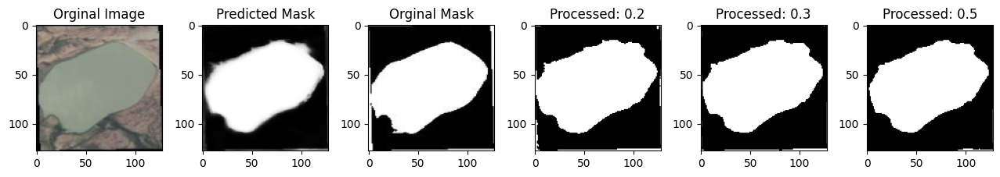

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7847 - loss: 0.1844
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7896 - loss: 0.177


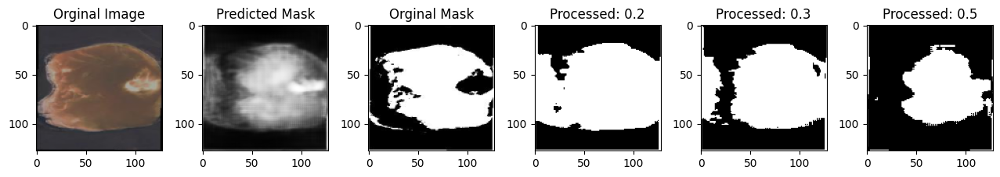

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7895 - loss: 0.1774
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7820 - loss: 0.183


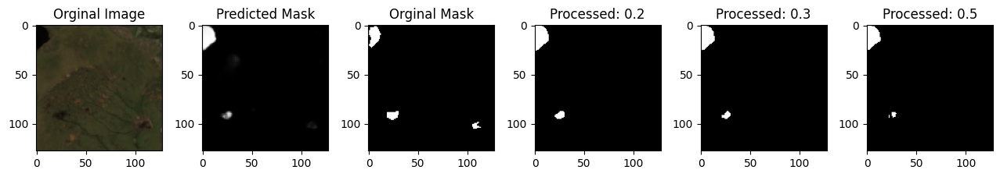

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - accuracy: 0.7820 - loss: 0.1833
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7868 - loss: 0.18


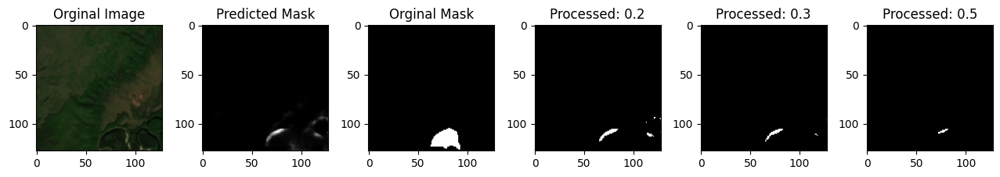

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7868 - loss: 0.1820
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7857 - loss: 0.188


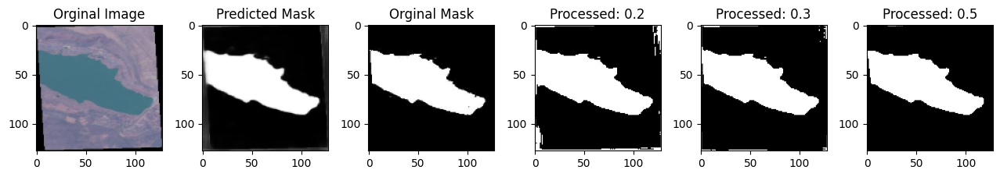

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7857 - loss: 0.1883
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7866 - loss: 0.17


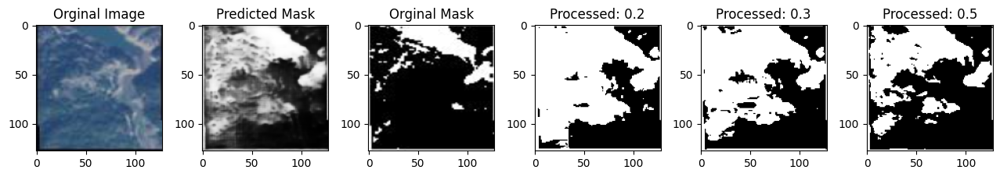

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.7866 - loss: 0.1787
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7865 - loss: 0.17


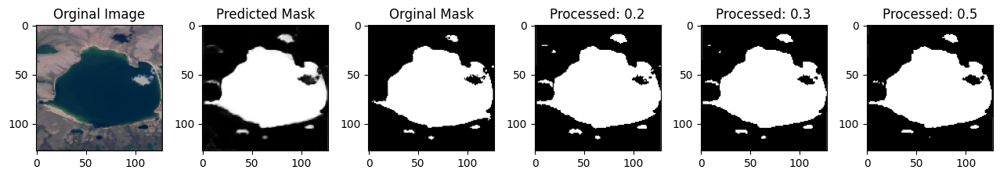

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7864 - loss: 0.1799
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/stepstep - accuracy: 0.7874 - loss: 0.174


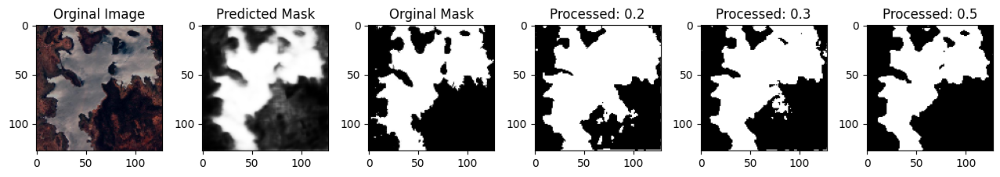

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7874 - loss: 0.1740
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepstep - accuracy: 0.7797 - loss: 0.190


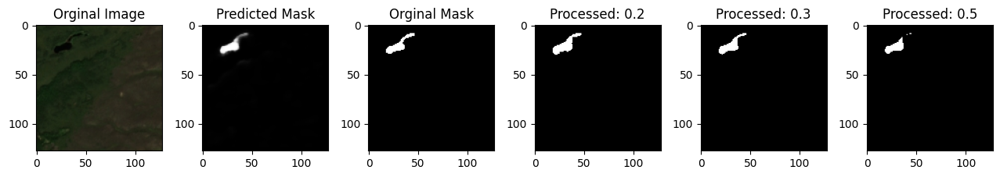

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.7797 - loss: 0.1909
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7763 - loss: 0.20


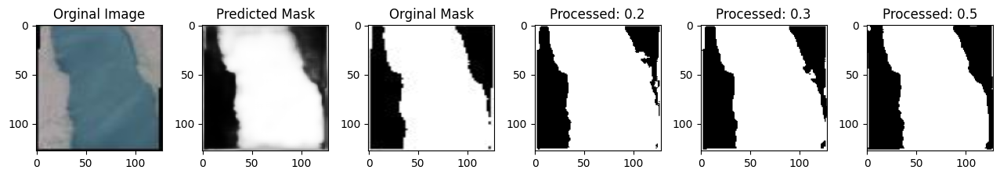

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7763 - loss: 0.2047
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepstep - accuracy: 0.7818 - loss: 0.19


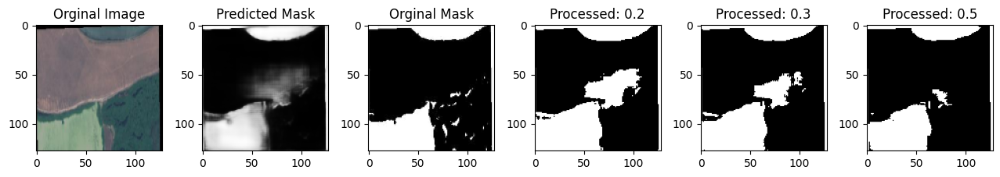

103/103 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - accuracy: 0.7818 - loss: 0.1923


In [8]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

In [12]:
from datetime import datetime

# Get the current date and time
current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

# Save the model with the current date and time in the filename
model.save(f'../models/{current_time}.keras')

In [11]:
# Make predictions
predictions = model.predict(images_test)

KeyError: 'pop from an empty set'